In [1]:
pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.8/679.8 kB 52.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 86.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 73.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=a94b02692dc5b1b0e3514871d9628470911ea1801a8a7f

In [2]:
import pandas_profiling

<ipython-input-2-6a00893fb3e1>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [3]:
import pandas as pd

In [4]:
import numpy as np

In [5]:
from sklearn.preprocessing import StandardScaler

In [6]:
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression

In [7]:

from sklearn.model_selection import train_test_split

In [8]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [9]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score

In [10]:
import matplotlib.pyplot as plt

In [11]:
import seaborn as sns

In [12]:
import pickle

In [21]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [14]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [15]:
from pandas_profiling import ProfileReport

In [16]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:

df['BMI'] = df['BMI'].replace(0 , df['BMI'].mean())

In [22]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [23]:
df['BloodPressure'] = df['BloodPressure'].replace(0, df['BloodPressure'].mean())

In [24]:
df['Glucose'] = df['Glucose'].replace(0, df['Glucose'].mean())

In [25]:
df['Insulin'] = df['Insulin'].replace(0, df['Insulin'].mean())

In [26]:
df['SkinThickness'] = df['SkinThickness'].replace(0, df['SkinThickness'].mean())

Box Plot to show outliers

<Axes: >

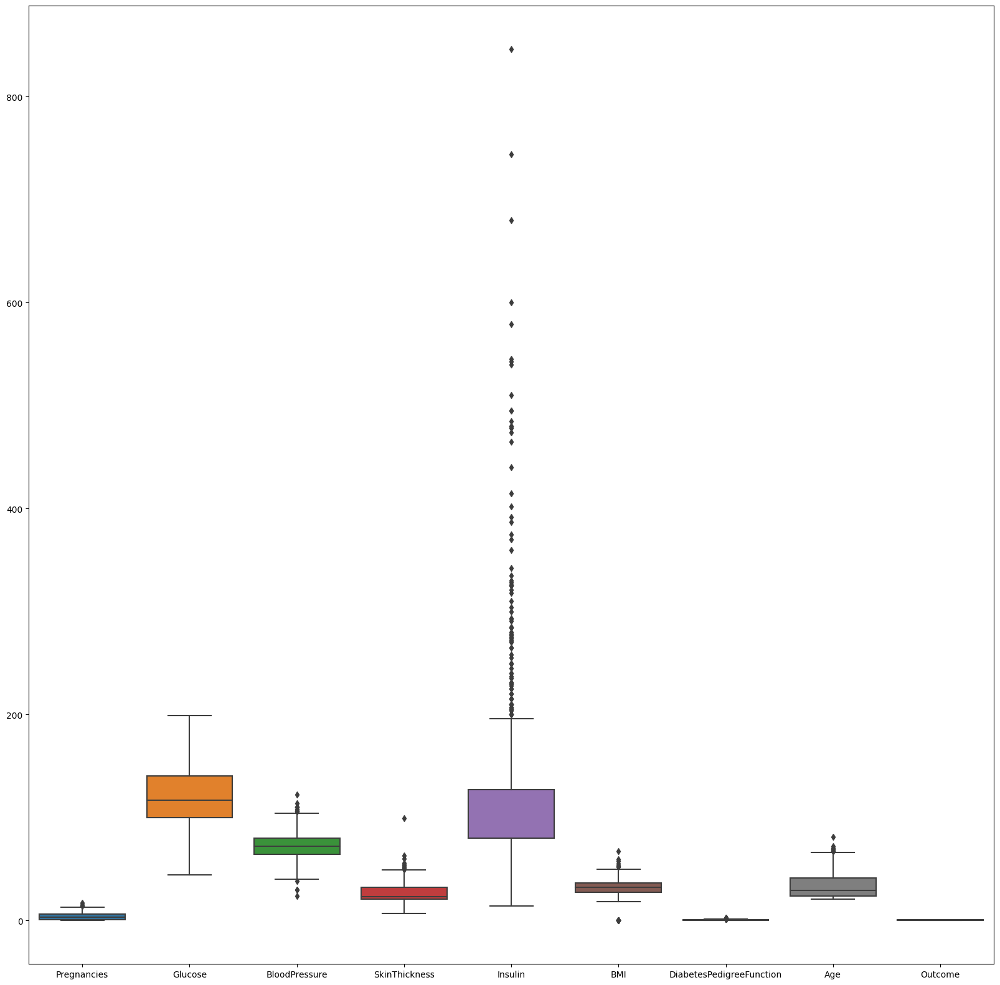

In [27]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df, ax = ax)

In [28]:
q = df['Insulin'].quantile(.70)
df_new = df[df['Insulin'] < q]

<Axes: >

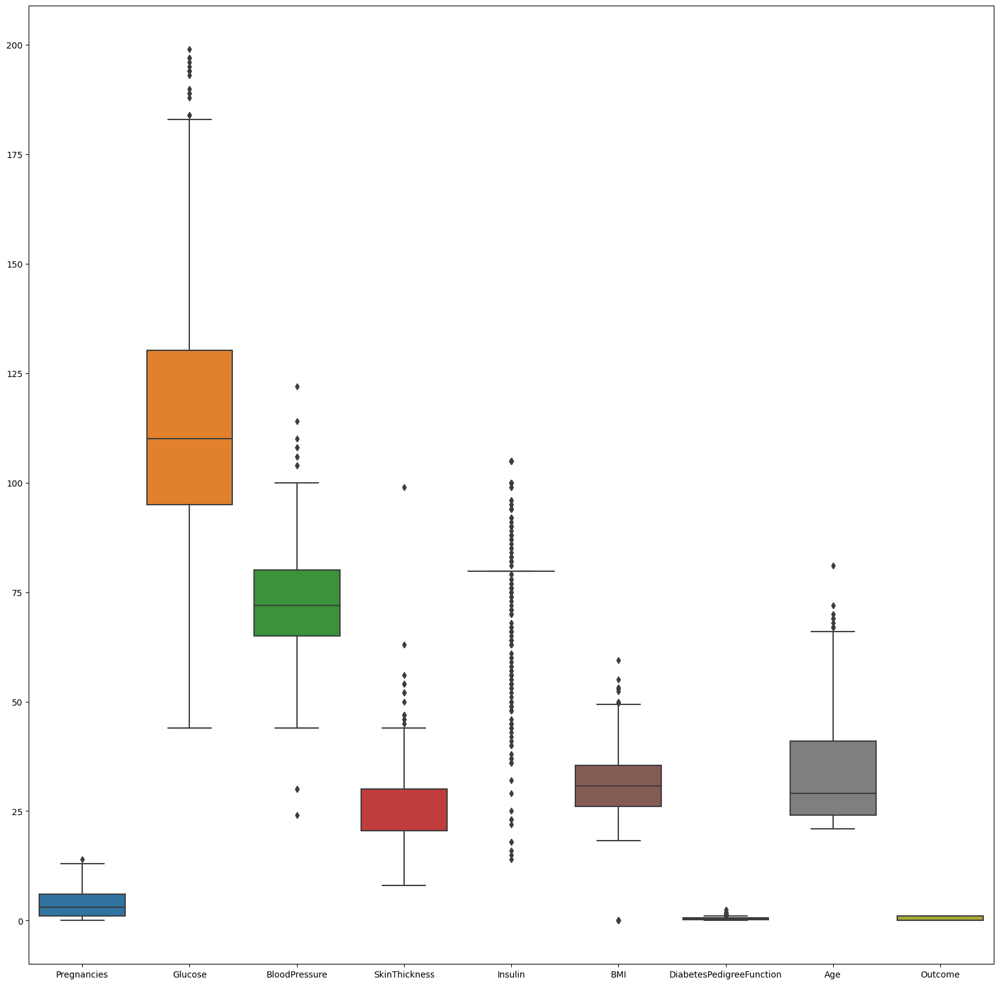

In [29]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df_new, ax = ax)

In [30]:
q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

q = df['BMI'].quantile(.99)
df_new =  df_new[df_new['BMI'] < q]


q= df['SkinThickness'].quantile(.99)
df_new = df_new[df_new['SkinThickness'] < q]

q = df['Insulin'].quantile(.99)
df_new = df_new[df_new['Insulin'] < q]

q = df['Age'].quantile(.99)
df_new = df_new[df_new['Age'] < q]

In [31]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<Axes: >

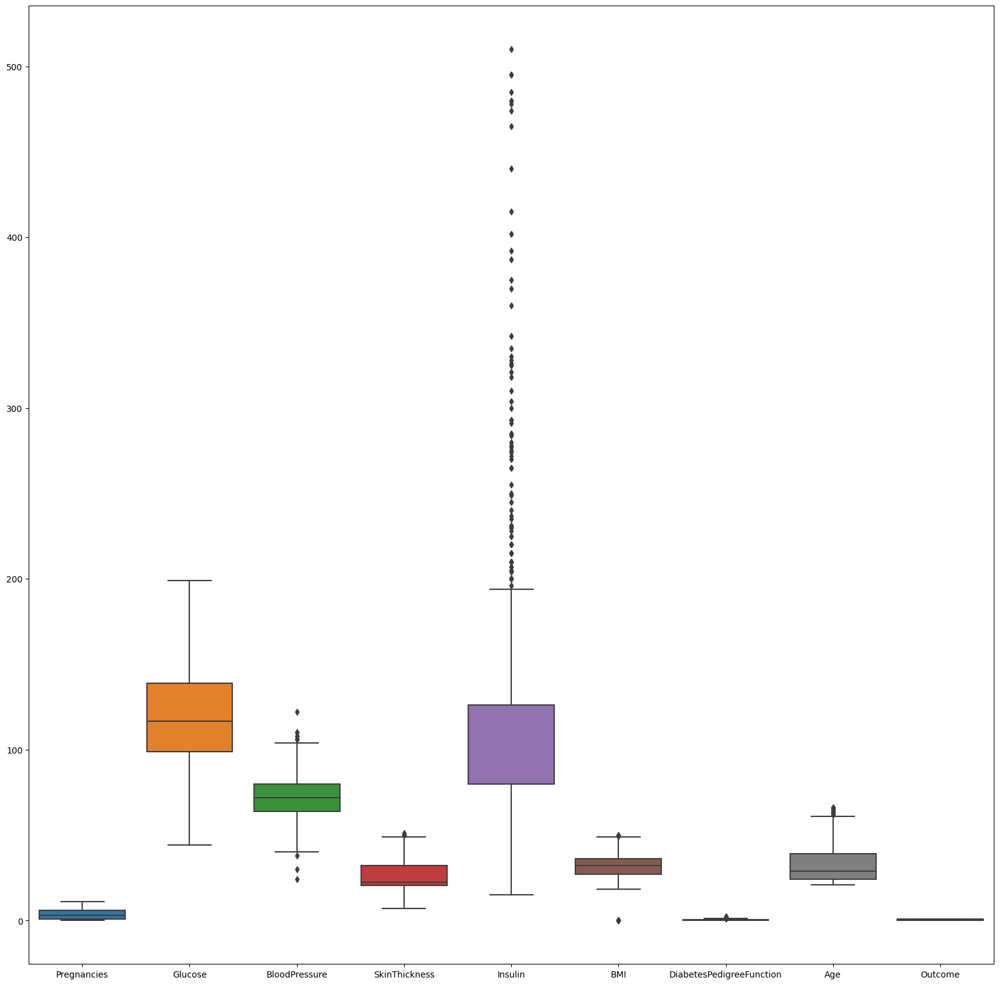

In [32]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df_new, ax = ax)

In [33]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [35]:
y = df_new['Outcome']

In [36]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 716, dtype: int64

In [37]:
x = df_new.drop(columns=['Outcome'])

In [38]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [39]:
scaler = StandardScaler()
ProfileReport(pd.DataFrame(scaler.fit_transform(x)))
x_scaled = scaler.fit_transform(x)

<Axes: >

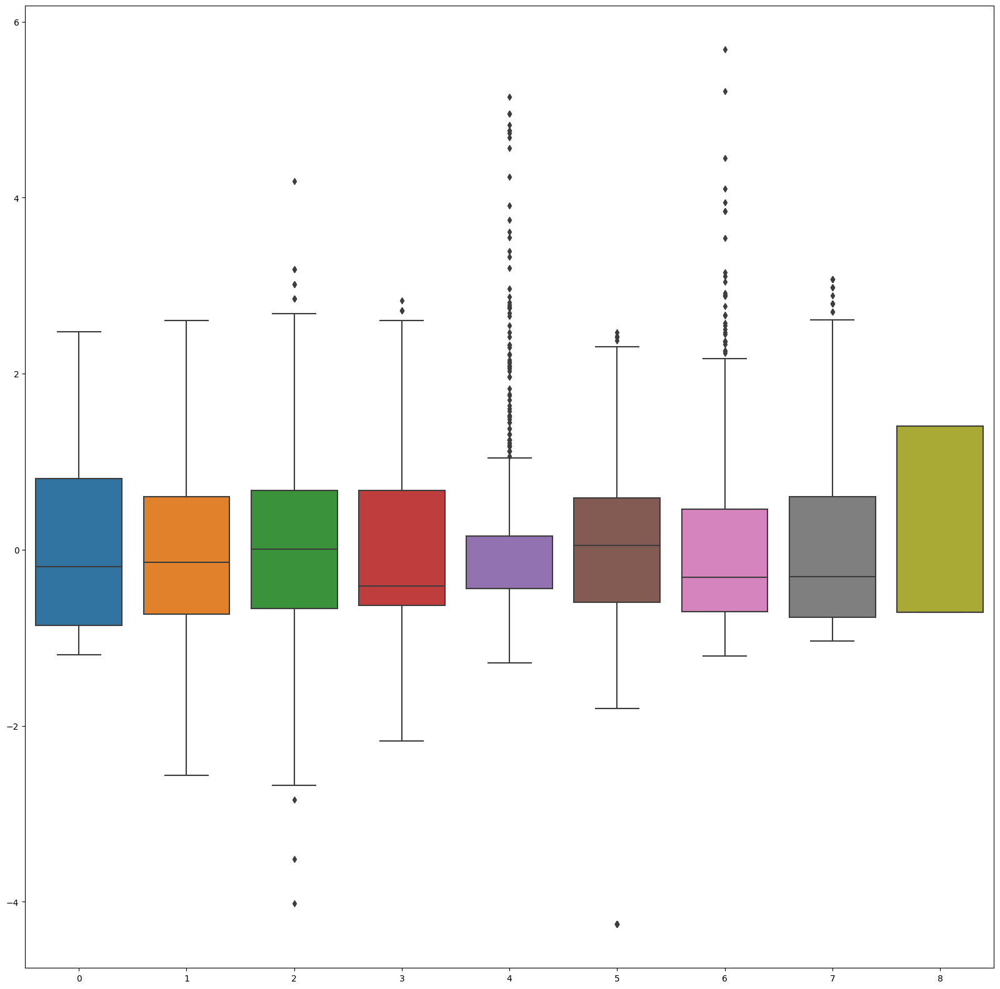

In [40]:
df_new_scaler = pd.DataFrame(scaler.fit_transform(df_new))
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df_new_scaler, ax = ax)

Dataset is dispersed equally

In [42]:
x_scaled

array([[ 0.80822764,  0.9059344 ,  0.003933  , ...,  0.26388706,
         0.5060621 ,  1.60917704],
       [-0.86043151, -1.19643634, -0.49855498, ..., -0.67766768,
        -0.35435232, -0.12615744],
       [ 1.4756913 ,  2.07391814, -0.66605097, ..., -1.12154349,
         0.64634705, -0.03482405],
       ...,
       [ 0.47449581,  0.00491836,  0.003933  , ..., -0.73147081,
        -0.68480133, -0.21749083],
       [-0.86043151,  0.17177319, -1.00104295, ..., -0.20689031,
        -0.3605872 ,  1.33517686],
       [-0.86043151, -0.92946863, -0.16356299, ..., -0.16653796,
        -0.46658028, -0.85682459]])

In [43]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 716, dtype: int64

Checking Colinearity

In [44]:
def vif_score(x):
  scaler = StandardScaler()
  arr = scaler.fit_transform(x)
  return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns = ["FEATURE", "VIF_SCORE"])

In [45]:
vif_score(x)

,FEATURE,VIF_SCORE
0,Pregnancies,1.474617
1,Glucose,1.363812
2,BloodPressure,1.226262
3,SkinThickness,1.420421
4,Insulin,1.305182
5,BMI,1.438581
6,DiabetesPedigreeFunction,1.041569
7,Age,1.681447


In [46]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size = .20, random_state = 144)

In [47]:
x_train

array([[-0.19296785,  1.64009561, -0.66605097, ...,  0.3849441 ,
        -0.3387651 , -0.21749083],
       [-1.19416334,  1.33975693, -1.83852292, ..., -1.30985444,
        -0.65674434,  2.97917794],
       [ 1.14195947,  2.44099875, -0.33105899, ...,  0.57325505,
         0.87392043,  0.7871765 ],
       ...,
       [-0.86043151, -1.39666213,  0.67391697, ..., -0.83907707,
         0.36889458, -0.94815798],
       [ 0.14076398,  0.37199897,  1.17640494, ..., -0.48935673,
        -0.14236616,  2.79651116],
       [ 0.47449581,  0.77245054,  0.84141296, ...,  0.04867455,
        -0.03949052,  2.33984419]])

In [48]:
x_test

array([[ 0.80822764,  0.77245054,  0.003933  , ...,  0.30423941,
        -0.65362689,  0.6958431 ],
       [ 0.47449581, -1.09632345, -0.49855498, ..., -0.97358489,
        -0.38240931, -0.21749083],
       [-0.86043151, -1.22980731, -0.66605097, ...,  0.70776287,
         0.01974091, -0.40015762],
       ...,
       [-1.19416334, -0.32879128, -0.58230297, ..., -0.94668332,
         0.60893773, -0.12615744],
       [-1.19416334, -0.09519453,  1.00890895, ...,  1.90488247,
         0.26913639, -0.12615744],
       [ 0.47449581, -0.16193646,  0.17142899, ...,  0.08902689,
         0.60893773,  0.23917614]])

In [49]:
y_train

132    1
294    0
185    1
643    0
634    0
      ..
693    1
456    0
232    0
479    0
388    1
Name: Outcome, Length: 572, dtype: int64

In [50]:
y_test

95     0
52     0
554    0
473    0
690    0
      ..
214    1
474    0
529    0
16     1
386    1
Name: Outcome, Length: 144, dtype: int64

In [51]:
x_test[0]

array([ 0.80822764,  0.77245054,  0.003933  ,  0.10259685,  1.48329699,
        0.30423941, -0.65362689,  0.6958431 ])

In [52]:
logr_liblinear = LogisticRegression(verbose = 1, solver='liblinear')

In [55]:
logr.fit(x_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [56]:
logr.predict([x_test[1]])

array([0])

In [57]:
logr.predict_proba([x_test[1]])

array([[0.92571637, 0.07428363]])

In [58]:
logr.predict_log_proba([x_test[1]])

array([[-0.07718739, -2.59986461]])

In [59]:
type(y_test)

pandas.core.series.Series

In [60]:
y_test.iloc[0]

0

In [61]:
y_test


95     0
52     0
554    0
473    0
690    0
      ..
214    1
474    0
529    0
16     1
386    1
Name: Outcome, Length: 144, dtype: int64

In [62]:
logr = LogisticRegression(verbose = 1)

In [63]:
logr.fit(x_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [64]:
logr

LogisticRegression(verbose=1)

In [65]:
logr_liblinear

LogisticRegression(solver='liblinear', verbose=1)

In [66]:
logr_liblinear.fit(x_train, y_train)

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [67]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0])

In [68]:
y_pred_default = logr.predict(x_test)

In [69]:
y_pred_default

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0])

In [70]:
confusion_matrix(y_test, y_pred_liblinear)

array([[87,  7],
       [19, 31]])

In [71]:
confusion_matrix(y_test, y_pred_default)

array([[87,  7],
       [19, 31]])

In [72]:
auc = roc_auc_score(y_test, y_pred_liblinear)

In [73]:
roc_auc_score(y_test, y_pred_default)

0.7727659574468084

In [74]:
fpr, tpr, thresholds =   roc_curve(y_test, y_pred_liblinear)

In [75]:
  roc_curve(y_test, y_pred_liblinear)

(array([0.        , 0.07446809, 1.        ]),
 array([0.  , 0.62, 1.  ]),
 array([2, 1, 0]))

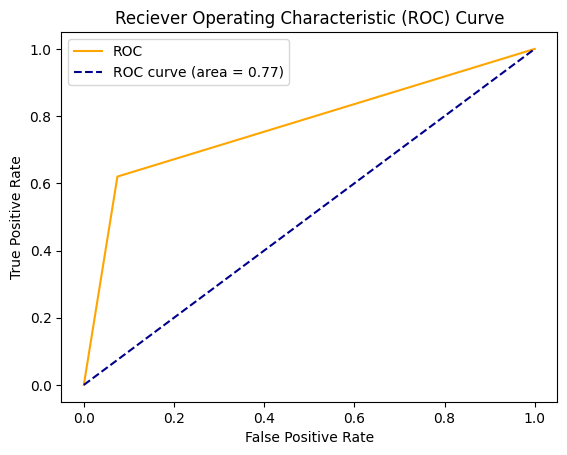

In [76]:
plt.plot(fpr, tpr, color = 'orange', label='ROC')
plt.plot([0, 1], [0,1], color='darkblue', linestyle='--', label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Reciever Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()